In [1]:
import my_package.rectification as rectification
msi_file="/home/llx/project/MSI_data/sma/V11L12-038/V11L12-038_B1/output_data/V11L12-038_B1_MSI/V11L12-038_B1.Visium.DHB.220826_smamsi.csv"
st_path="/home/llx/project/MSI_data/sma/V11L12-038/V11L12-038_B1/output_data/V11L12-038_B1_RNA/outs/"
msi_path="/home/llx/project/MSI_data/sma/V11L12-038/V11L12-038_B1/output_data/V11L12-038_B1_MSI/"
import importlib
import pandas as pd
import torch
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
import anndata as ad

/home/llx/software/miniconda3/envs/pyg_ms/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
# seed_everything()
seed=2025
rectification.fix_seed(seed)

76 74


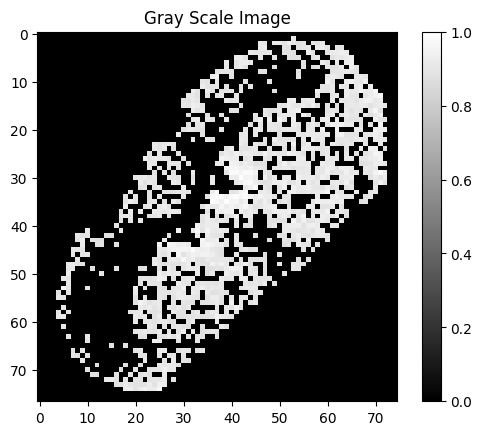

In [3]:
ms_org=pd.read_csv(msi_file)
ms_sp=ms_org.copy()
print(np.max(ms_sp.loc[:,"x"]),np.max(ms_sp.loc[:,"y"]))
ms=rectification.msi_sum(ms_sp,0.88)#89
rectification.tensor_viewer(ms)

In [4]:
# # 计算每一行的总和（从第3列开始）
# row_sums = ms_sp.iloc[:,2:].sum(axis=1)

# # 删除总和为0的行
# ms_n = ms_sp[row_sums >= 1e6]

In [5]:
# from scipy.sparse import csr_matrix, csc_matrix, coo_matrix
# ms_intensity = csr_matrix(ms_n.iloc[:,2:], dtype=np.float32)
# print(ms_intensity.shape)
# ms_adata = ad.AnnData(ms_intensity)
# ms_adata.obs["array_row"]=ms_n.iloc[:,0] ##raw x
# ms_adata.obs["array_col"]=ms_n.iloc[:,1] ##raw y
# ms_adata.var_names=ms_n.iloc[:,2:].columns
# ms_adata.obsm["spatial"]=ms_n.loc[:,["x","y"]].to_numpy()
# # ms_adata.obs_names=ms_n.index

In [6]:
# import squidpy as sq
# sq.gr.spatial_neighbors(ms_adata)
# sq.gr.spatial_autocorr(ms_adata, mode="moran", genes=ms_adata.var_names)

In [7]:
# high_moran_genes2 = ms_adata.uns['moranI']['I'][(ms_adata.uns['moranI']['I'] > 0.5) & (ms_adata.uns['moranI']['pval_norm'] < 0.05)].index.tolist()
# adata_high_moran2 = ms_adata[:, high_moran_genes2]
# adata_high_moran2.var_names

In [8]:
# import scanpy as scn
# sc.pp.highly_variable_genes(ms_adata, flavor="seurat_v3", n_top_genes=100)
# columns_to_sum = ms_adata[:, ms_adata.var['highly_variable']].var_names

In [9]:
# def standard(vec_1):
#     return (vec_1-min(vec_1))/(max(vec_1)-min(vec_1))

# def msi_sum(ms, threshold, columns_to_sum):
#     """
#     对指定的列进行求和，并生成标准化后的矩阵

#     参数:
#     ms -- 包含x, y坐标和多列数据的DataFrame
#     threshold -- 标准化后值的阈值，低于此阈值的将被设为0
#     columns_to_sum -- 要进行求和的列名列表

#     返回:
#     ms_sum -- 标准化后并应用阈值的矩阵
#     """
#     # 选择特定的列进行求和
#     if columns_to_sum is None:
#         # 如果没有指定列，则对所有列进行求和
#         ms_n = pd.concat([ms.loc[:, ["x", "y"]], ms.iloc[:, 2:].sum(axis=1)], axis=1)
#     else:
#         # 如果指定了列，则只对这些列进行求和
#         ms_n = pd.concat([ms.loc[:, ["x", "y"]], ms[columns_to_sum].sum(axis=1)], axis=1)

#     ms_n.columns = ["x", "y", "sum"]

#     # 对求和后的值进行标准化
#     ms_n.loc[:, "sum_standard"] = standard(ms_n.loc[:, "sum"])

#     # 构建矩阵
#     ms_sum_matrix = ms_n.pivot(index='x', columns='y', values="sum_standard")

#     # 应用阈值
#     ms_sum = np.where(ms_sum_matrixn < threshold, 0, ms_sum_matrix)

#     return ms_sumc

In [10]:
# ms=msi_sum(ms_sp,0.1,adata_high_moran2.var_names)
# rectification.tensor_viewer(ms)

In [11]:
org_size=ms.shape

In [12]:
org_size

(77, 75)

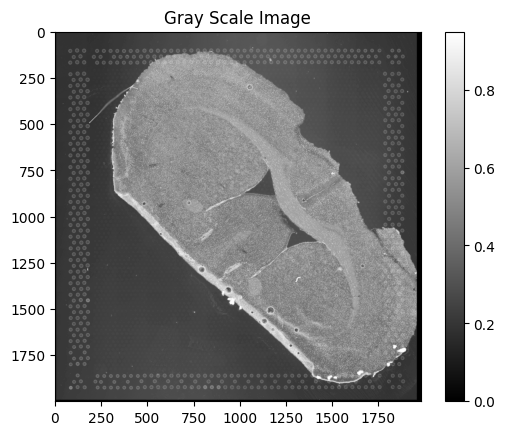

In [13]:
image_path = '/home/llx/project/MSI_data/sma/V11L12-038/V11L12-038_B1/output_data/V11L12-038_B1_RNA/outs/spatial/tissue_hires_image.png'

normalized_gray_image=rectification.he_img(image_path)
rectification.tensor_viewer(normalized_gray_image)

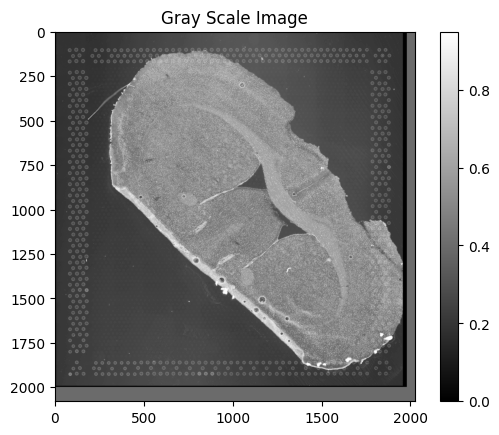

In [14]:
HE_tensor,msi_tensor,rate=rectification.he_padding(ms,normalized_gray_image,0.4)#填充到与MSI等比例
rectification.tensor_viewer(HE_tensor)

In [15]:
target_size=np.array(HE_tensor.shape[2:4])
target_size

array([2079, 2025])

In [16]:
device=torch.device("cuda")

In [17]:
fit_af=rectification.fit(device=device,num_epochs=1000)
fit_af.train_AF(msi_tensor,HE_tensor,list(target_size))#训练

  0%|          | 0/1000 [00:00<?, ?it/s]/home/llx/software/miniconda3/envs/pyg_ms/lib/python3.9/site-packages/torch/nn/functional.py:4227: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
100%|██████████| 1000/1000 [00:02<00:00, 491.24it/s]


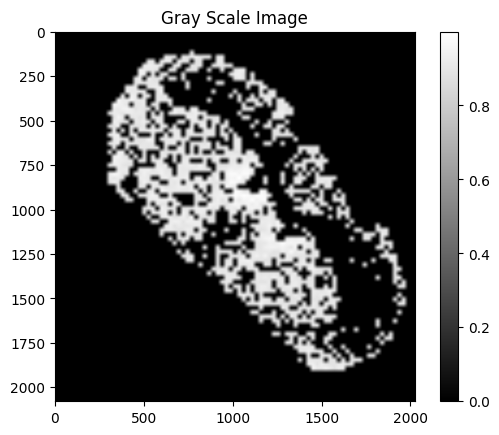

torch.Size([1, 1, 2079, 2025])


In [18]:
af_msi=fit_af.net(msi_tensor.to(device))
rectification.tensor_viewer(af_msi.cpu().detach())
print(af_msi.shape)

In [19]:
af_theta=fit_af.net.theta.squeeze().cpu().detach()
print(af_theta)

tensor([[-1.1103,  0.0000,  0.1608],
        [ 0.0000,  1.1103,  0.0199]])


In [20]:
def torch_af_transfor(af_theta,shape,org_shape,points):

    H, W=org_shape

    points_norm = torch.stack([
        (points[:, 0] / W)*2-1,
        (points[:, 1] / H)*2-1], dim=0).T
    #补齐af
    line3=torch.tensor([[0,0,1]],dtype=torch.float32)
    al_3=torch.cat([af_theta,line3],dim=0)
    af_norm=torch.inverse(al_3)
    #补齐点
    ones=torch.ones(points_norm.shape[0],1)
    points_norm=torch.cat([points_norm,ones],dim=1)
    points_norm=points_norm.T
    print(points_norm.shape)
    print(af_norm.shape)
    points_norm=torch.mm(af_norm,points_norm).T

    print(points_norm)
    H_prime, W_prime = shape

    transformed_points = torch.stack([
        (points_norm[:, 0]+1)/2 * W_prime,
        (points_norm[:, 1]+1)/2 * H_prime
    ], dim=0)

    return transformed_points.T

In [21]:
ms_org_x_y = torch.tensor(np.array(ms_sp.loc[:,["y","x"]]),dtype=torch.float32)

ms_he = torch_af_transfor(af_theta,target_size,org_size,ms_org_x_y)

ms_he

torch.Size([3, 5775])
torch.Size([3, 3])
tensor([[ 1.0455, -0.9186,  1.0000],
        [ 1.0214, -0.9186,  1.0000],
        [ 0.9974, -0.9186,  1.0000],
        ...,
        [-0.6838,  0.8593,  1.0000],
        [-0.7078,  0.8593,  1.0000],
        [-0.7318,  0.8593,  1.0000]])


tensor([[2071.0339,   84.6467],
        [2046.7167,   84.6467],
        [2022.3995,   84.6467],
        ...,
        [ 320.1935, 1932.7560],
        [ 295.8763, 1932.7560],
        [ 271.5590, 1932.7560]])

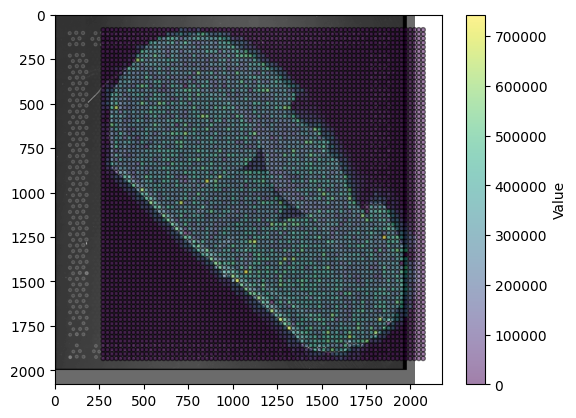

In [22]:
ms_sp.loc[:,["he_x","he_y"]]=ms_he.numpy()
plt.imshow(HE_tensor.squeeze().detach().cpu(), cmap='gray')
scatter = plt.scatter(ms_sp['he_x'], 
                    ms_sp['he_y'], 
                    c=ms_sp['951.55627'], 
                    cmap='viridis', 
                    s=10,
                    alpha=0.5,
                    edgecolor='k')

plt.colorbar(scatter, label='Value')

In [23]:
ms_sp

,x,y,130.05041,132.07691,132.077165,133.074345,133.08065,136.01592,136.048655,136.06234,...,986.58098,989.5183649999999,990.4988149999999,991.50214,992.560465,992.614545,994.56201,996.51046,he_x,he_y
0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2071.033936,84.646690
1,0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2046.716675,84.646690
2,0,2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2022.399536,84.646690
3,0,3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1998.082397,84.646690
4,0,4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1973.765015,84.646690
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5770,76,70,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,368.827942,1932.755981
5771,76,71,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,344.510742,1932.755981
5772,76,72,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,320.193542,1932.755981
5773,76,73,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,295.876251,1932.755981


In [27]:
import SM2ST
ms_adata = SM2ST.ms2anndata(ms_org = ms_org,ms_sp = ms_sp,HE_path = image_path,in_tissue=True)

In [28]:
import scanpy as sc
st_adata=sc.read_visium(st_path,
               count_file='filtered_feature_bc_matrix.h5',
               source_image_path="tissue_hires_image.png")
st_adata

/home/llx/software/miniconda3/envs/pyg_ms/lib/python3.9/site-packages/anndata/_core/anndata.py:1756: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/llx/software/miniconda3/envs/pyg_ms/lib/python3.9/site-packages/anndata/_core/anndata.py:1756: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


AnnData object with n_obs × n_vars = 3002 × 32285
    obs: 'in_tissue', 'array_row', 'array_col'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial'
    obsm: 'spatial'

In [45]:
st_adata.uns['spatial']['V11L12-038_B1']['scalefactors']['tissue_hires_scalef']

0.04155585

In [29]:
st_adata.uns['spatial']['V11L12-038_B1']['scalefactors']['tissue_lowres_scalef']/st_adata.uns['spatial']['V11L12-038_B1']['scalefactors']['tissue_hires_scalef']

0.30000002406400067

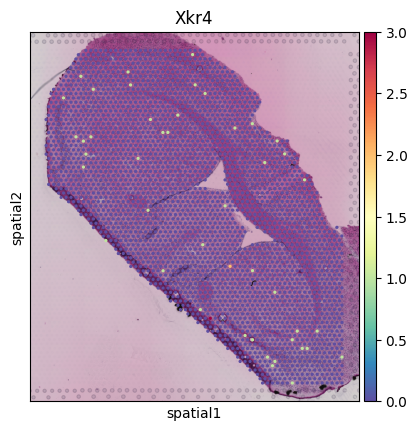

In [30]:
sc.pl.spatial(st_adata, 
              img_key="hires", 
              color=['Xkr4'], 
              cmap='Spectral_r', 
              ncols=3,
              img=None, 
              size=1,
              spot_size=None,
              bw=False, 
              alpha_img=1)#color是一个感兴趣的基因的list

In [31]:
st_adata.X.A

array([[0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 1., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 2.],
       ...,
       [0., 0., 0., ..., 0., 0., 2.],
       [0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 1.]], dtype=float32)

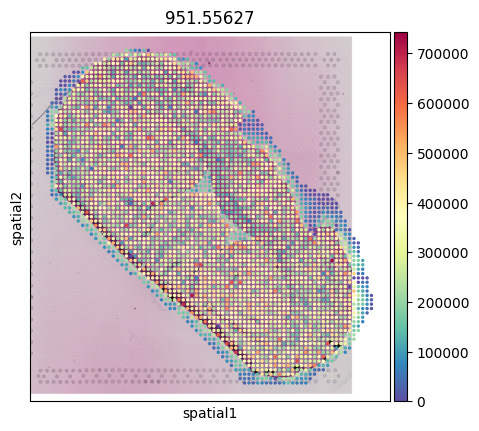

In [32]:
sc.pl.spatial(ms_adata, 
              img_key="hires", 
              color=['951.55627'], 
              cmap='Spectral_r', 
              ncols=3,
              img=None, 
              size=0.05,
              spot_size=None,
              bw=False, 
              alpha_img=1)#color是一个感兴趣的基因的list


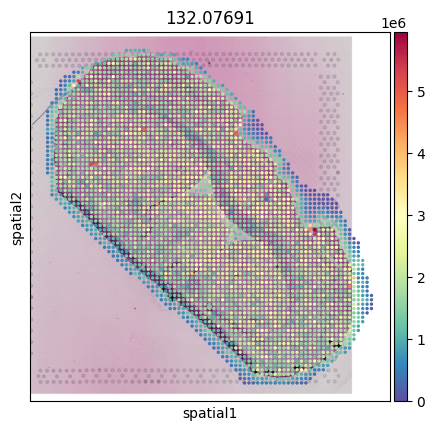

In [33]:
sc.pl.spatial(ms_adata, 
              img_key="hires", 
              color=['132.07691'], 
              cmap='Spectral_r', 
              ncols=3,
              img=None, 
              size=0.05,
              spot_size=None,
              bw=False, 
              alpha_img=1)#color是一个感兴趣的基因的list

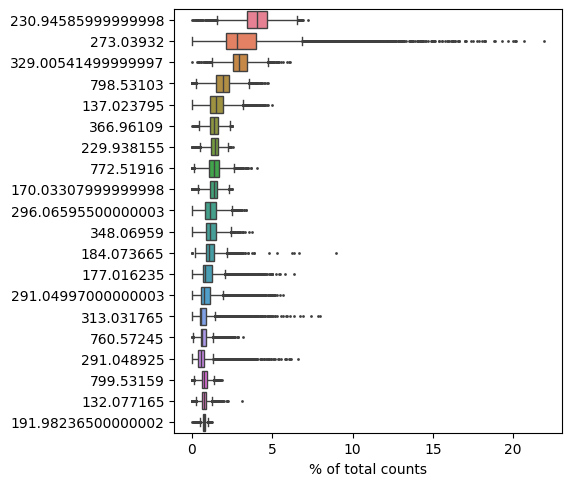

In [34]:
sc.pl.highest_expr_genes(ms_adata, n_top=20, )

In [35]:
st_intensity = csr_matrix(st_adata.X.A, dtype=np.float32)
print(st_intensity.shape)
st_adata1 = ad.AnnData(st_intensity)
st_adata1.var_names=st_adata.var_names
st_adata1.obs_names=st_adata.obs_names
st_adata1.obs["array_row"]=st_adata.obs["array_row"]##raw x
st_adata1.obs["array_col"]=st_adata.obs["array_col"]##raw y
st_adata1.obsm["spatial"]=st_adata.obsm["spatial"]*st_adata.uns['spatial']['V11L12-038_B1']['scalefactors']['tissue_hires_scalef']
from PIL import Image
image_path = '/home/llx/project/MSI_data/sma/V11L12-038/V11L12-038_B1/output_data/V11L12-038_B1_RNA/outs/spatial/tissue_hires_image.png'
image = Image.open(image_path)
image_array = np.array(image)
spatial_key = "spatial"
library_id = "V11L12-038_B1"  # 你可以自定义这个 ID
st_adata1.uns[spatial_key] = {library_id: {}}
st_adata1.uns[spatial_key][library_id]["images"] = {"hires": image_array}
st_adata1.uns[spatial_key][library_id]["scalefactors"] = {
    "tissue_hires_scalef": 1,  # 图像像素和空间坐标的比例因子
    "spot_diameterres_full": 0.5,  # 每个观测点的直径
    'fiducial_diameter_fullres': 609.8565193216596,
    'spot_diameter_fullres': 377.5302262467417
}

(3002, 32285)


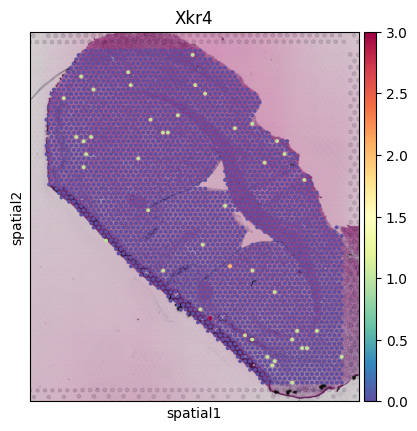

In [36]:
sc.pl.spatial(st_adata1, 
              img_key="hires", 
              color=['Xkr4'], 
              cmap='Spectral_r', 
              ncols=3,
              img=None, 
              size=0.05,
              spot_size=None,
              bw=False, 
              alpha_img=1)#color是一个感兴趣的基因的list

In [37]:
st_adata1.obsm['spatial'].shape

(3002, 2)

In [38]:
ms_adata.obsm['spatial'].shape

(3519, 2)

In [39]:
ms_adata.obsm['spatial']

array([[ 830.8553 ,   84.64669],
       [ 806.538  ,   84.64669],
       [ 782.2209 ,   84.64669],
       ...,
       [1414.4688 , 1932.756  ],
       [1390.1515 , 1932.756  ],
       [1365.8344 , 1932.756  ]], dtype=float32)

In [40]:
ms_adata.uns['coord'] = st_adata1.obsm['spatial']

<Axes: title={'center': '130.05041'}, xlabel='spatial1', ylabel='spatial2'>

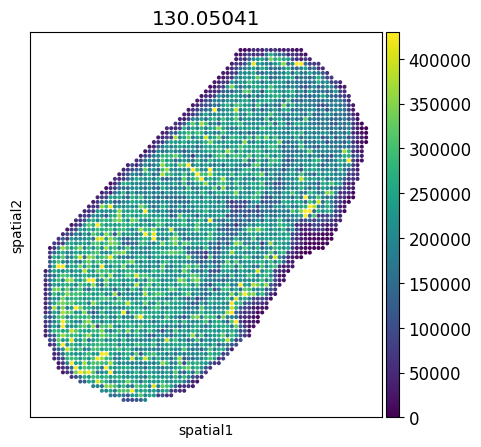

In [41]:
plot_gene = '130.05041'#
fig, ax = plt.subplots(figsize=(5, 5))  # 例如，figsize=(10, 8) 表示宽度为
plt.rcParams['font.size'] = 12  # 假设默认字体大小是10
sc.pl.embedding(ms_adata, basis="spatial", color=plot_gene, show=False,vmax='p99', ax=ax)

In [42]:
# sc.pp.normalize_total(ms_adata, target_sum=1e3)
sc.pp.normalize_total(ms_adata, target_sum=1e4)
sc.pp.log1p(ms_adata)

<Axes: title={'center': '951.55627'}, xlabel='spatial1', ylabel='spatial2'>

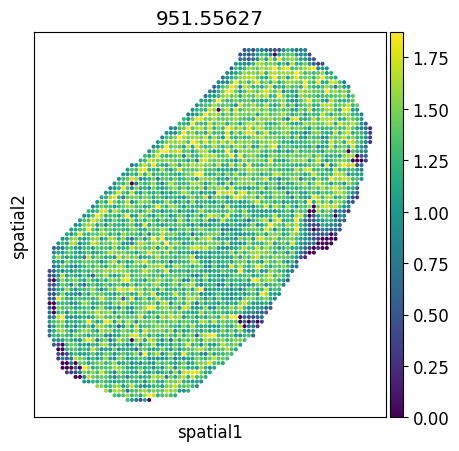

In [43]:
plot_gene = '951.55627'#
fig, ax = plt.subplots(figsize=(5, 5))  # 例如，figsize=(10, 8) 表示宽度为
plt.rcParams['font.size'] = 12  # 假设默认字体大小是10
sc.pl.embedding(ms_adata, basis="spatial", color=plot_gene, show=False,vmax='p99', ax=ax)

<Axes: title={'center': '132.07691'}, xlabel='spatial1', ylabel='spatial2'>

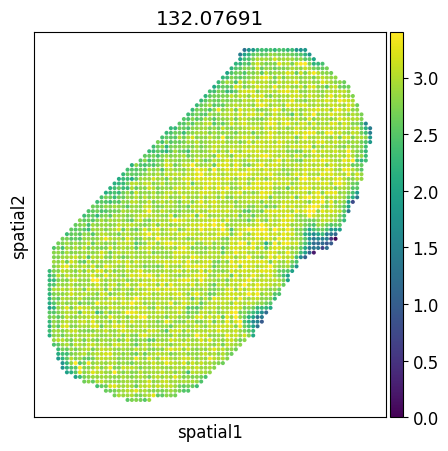

In [44]:
plot_gene = '132.07691'#
fig, ax = plt.subplots(figsize=(5, 5))  # 例如，figsize=(10, 8) 表示宽度为
plt.rcParams['font.size'] = 12  # 假设默认字体大小是10
sc.pl.embedding(ms_adata, basis="spatial", color=plot_gene, show=False,vmax='p99', ax=ax)

In [46]:
import SM2ST
adata_SMLED = SM2ST.train_SMLED(adata=ms_adata, mask_ratio=0., coord_sf=2.0, train_epoch=15000, save_reconstrction=True, experiment='generation', WMMSE=1.)

Size of Input:  (3519, 2754)
271.5589904785156 84.64669036865234
pixel_step: 48.204785999999785
              0         1
0     12.602506   1.00000
1     12.098048   1.00000
2     11.593593   1.00000
3     11.089135   1.00000
4     10.584678   1.00000
...         ...       ...
3514  25.718381  39.33871
3515  25.213924  39.33871
3516  24.709467  39.33871
3517  24.205009  39.33871
3518  23.700554  39.33871

[3519 rows x 2 columns]               0          1
0     25.379486  25.328502
1     10.584659   4.868157
2     24.132073  30.122467
3     28.632073  23.146605
4     30.889831  27.065571
...         ...        ...
2997  14.865693  27.953502
2998  14.613107  25.775916
2999  10.343280  13.145743
3000  15.852762  14.011260
3001  12.589831   6.608674

[3002 rows x 2 columns]


Epochs: 100%|██████████| 15000/15000 [3:49:16<00:00,  1.09it/s, loss_re: 0.05858, loss_lat: 0.15648, loss_GA: 0.00010, loss: 0.10563, loss_DA: 1.38448]  


<Axes: title={'center': '132.07691'}, xlabel='spatial1', ylabel='spatial2'>

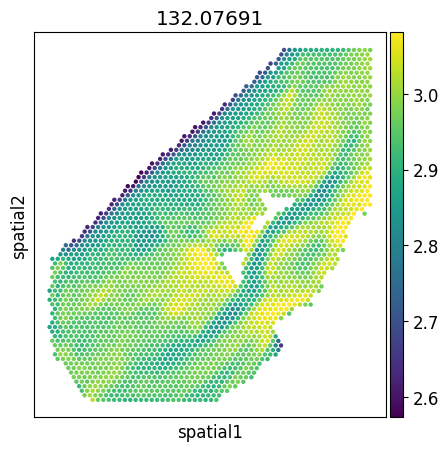

In [47]:
plot_gene = '132.07691'#
fig, ax = plt.subplots(figsize=(5, 5))  # 例如，figsize=(10, 8) 表示宽度为
plt.rcParams['font.size'] = 12  # 假设默认字体大小是10
sc.pl.embedding(adata_SMLED, basis="spatial", color=plot_gene, show=False,vmax='p99', ax=ax)

<Axes: title={'center': '951.55627'}, xlabel='spatial1', ylabel='spatial2'>

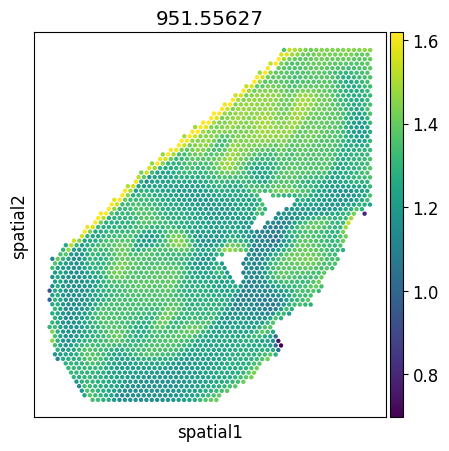

In [48]:
plot_gene = '951.55627'#
fig, ax = plt.subplots(figsize=(5, 5))  # 例如，figsize=(10, 8) 表示宽度为
plt.rcParams['font.size'] = 12  # 假设默认字体大小是10
sc.pl.embedding(adata_SMLED, basis="spatial", color=plot_gene, show=False,vmax='p99', ax=ax)

In [43]:
from PIL import Image
image_path = '/home/llx/project/MSI_data/sma/V11L12-038/V11L12-038_B1/output_data/V11L12-038_B1_RNA/outs/spatial/tissue_hires_image.png'
image = Image.open(image_path)
image_array = np.array(image)
spatial_key = "spatial"
library_id = "V11L12-038_B1"  # 你可以自定义这个 ID
adata_SMLED.uns[spatial_key] = {library_id: {}}
adata_SMLED.uns[spatial_key][library_id]["images"] = {"hires": image_array}
adata_SMLED.uns[spatial_key][library_id]["scalefactors"] = {
    "tissue_hires_scalef": 1,  # 图像像素和空间坐标的比例因子
    "spot_diameterres_full": 0.5,  # 每个观测点的直径
    'fiducial_diameter_fullres': 609.8565193216596,
    'spot_diameter_fullres': 377.5302262467417
}

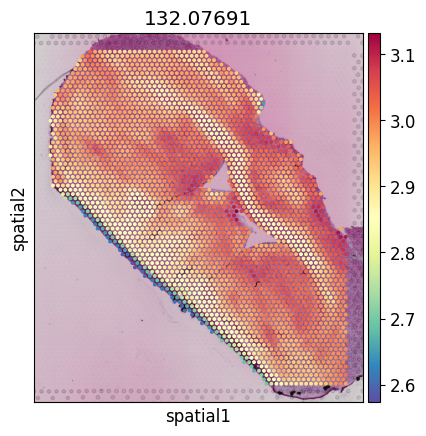

In [50]:
sc.pl.spatial(adata_SMLED, 
              img_key="hires", 
              color=['132.07691'], 
              cmap='Spectral_r', 
              ncols=3,
              img=None, 
              size=0.05,
              spot_size=None,
              bw=False, 
              alpha_img=1)#color是一个感兴趣的基因的list

In [84]:
# adata_SMLED.write_h5ad('/home/llx/project/jupyternotebook/1_pyg_backup/SMLED_pyG_result/adata_SMLED_21_new.h5ad')

In [42]:
adata_SMLED = sc.read_h5ad('/home/llx/project/jupyternotebook/1_pyg_backup/SMLED_pyG_result/adata_SMLED_21.h5ad')

In [44]:
import squidpy as sq
sq.gr.spatial_neighbors(adata_SMLED)
sq.gr.spatial_autocorr(adata_SMLED, mode="moran", genes=adata_SMLED.var_names)
sq.gr.spatial_autocorr(adata_SMLED, mode="geary", genes=adata_SMLED.var_names)

/home/llx/software/miniconda3/envs/pyg_ms/lib/python3.9/site-packages/numba/core/decorators.py:246: RuntimeWarning: nopython is set for njit and is ignored
  warnings.warn('nopython is set for njit and is ignored', RuntimeWarning)
/home/llx/software/miniconda3/envs/pyg_ms/lib/python3.9/site-packages/scanpy/metrics/_gearys_c.py:295: UserWarning: 722 variables were constant, will return nan for these.
  warnings.warn(
/home/llx/software/miniconda3/envs/pyg_ms/lib/python3.9/site-packages/scanpy/metrics/_gearys_c.py:295: UserWarning: 722 variables were constant, will return nan for these.
  warnings.warn(


In [45]:
import squidpy as sq
sq.gr.spatial_neighbors(ms_adata)
sq.gr.spatial_autocorr(ms_adata, mode="moran", genes=ms_adata.var_names)
sq.gr.spatial_autocorr(ms_adata, mode="geary", genes=ms_adata.var_names)

In [46]:
ms_adata_high_moran_genes = ms_adata.uns['moranI']['I'][(ms_adata.uns['moranI']['I'] > 0.5) & (ms_adata.uns['moranI']['pval_norm'] < 0.05)].index.tolist()
ms_adata_high_moran = ms_adata[:, ms_adata_high_moran_genes]

ms_adata_high_geary_genes = ms_adata.uns['gearyC']['C'][(ms_adata.uns['gearyC']['C'] < 0.5) & (ms_adata.uns['gearyC']['pval_norm'] < 0.05)].index.tolist()
ms_adata_high_geary = ms_adata[:, ms_adata_high_geary_genes]

In [47]:
adata_SMLED_high_moran_genes = adata_SMLED.uns['moranI']['I'][(adata_SMLED.uns['moranI']['I'] > 0.5) & (adata_SMLED.uns['moranI']['pval_norm'] < 0.05)].index.tolist()
adata_SMLED_high_moran = adata_SMLED[:, adata_SMLED_high_moran_genes]

adata_SMLED_high_geary_genes = adata_SMLED.uns['gearyC']['C'][(adata_SMLED.uns['gearyC']['C'] < 0.5) & (adata_SMLED.uns['gearyC']['pval_norm'] < 0.05)].index.tolist()
adata_SMLED_high_geary = adata_SMLED[:, adata_SMLED_high_geary_genes]

In [48]:
ms_adata_high_geary.var_names
# ms_adata_high_geary[:, ms_adata_high_geary.var['highly_variable']].var_names

Index(['214.01164', '617.9799350000001', '162.11293999999998',
       '214.01101999999997', '617.97608', '185.032815', '170.03307999999998',
       '258.110295', '251.9674', '346.04636500000004',
       ...
       '206.056175', '594.09891', '273.04934000000003', '599.937375',
       '514.974305', '526.2902650000001', '227.11426', '398.99552500000004',
       '711.430485', '368.9973'],
      dtype='object', length=981)

In [49]:
ms_adata_high_moran.var_names
# ms_adata_high_moran[:, ms_adata_high_moran.var['highly_variable']].var_names

Index(['162.11293999999998', '617.9799350000001', '214.01101999999997',
       '214.01164', '617.97608', '838.6165', '346.04636500000004',
       '185.032815', '204.12358', '251.9674',
       ...
       '602.580595', '327.10018', '652.43748', '273.03063', '867.47465',
       '154.05953499999998', '518.3195949999999', '206.056175',
       '200.06930499999999', '565.978525'],
      dtype='object', length=950)

In [50]:
ms_adata_set1 = set(ms_adata_high_geary.var_names)
ms_adata_set2 = set(ms_adata_high_moran.var_names)
ms_adata_v = ms_adata_set1&ms_adata_set2

In [51]:
len(ms_adata_v)

950

In [52]:
adata_SMLED_set1 = set(adata_SMLED_high_geary.var_names)
adata_SMLED_set2 = set(adata_SMLED_high_moran.var_names)
adata_SMLED_v = adata_SMLED_set1&adata_SMLED_set2

In [53]:
len(adata_SMLED_v)

2027

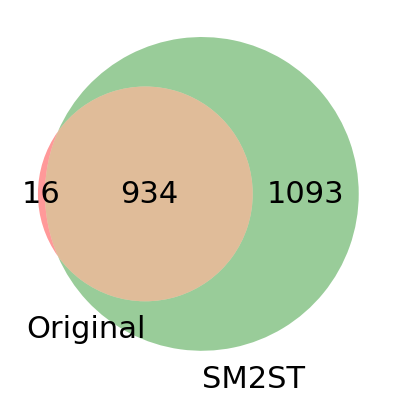

In [69]:
import matplotlib.pyplot as plt
from matplotlib_venn import venn2

# 定义两个集合
set1 = ms_adata_v
set2 = adata_SMLED_v

# 绘制韦恩图
venn = venn2([set1, set2], ('Original', 'SM2ST'))

# 设置标签显示交集和差集的数目
venn.get_label_by_id('100').set_text(f'{len(set1 - set2)}')
venn.get_label_by_id('010').set_text(f'{len(set2 - set1)}')
venn.get_label_by_id('110').set_text(f'{len(set1 & set2)}')
venn.get_label_by_id('100').set_fontsize(22)
venn.get_label_by_id('010').set_fontsize(22)
venn.get_label_by_id('110').set_fontsize(22)
# 设置集合标签的字体大小
venn.get_label_by_id('A').set_fontsize(22)  # 设置集合1的标签字体大小
venn.get_label_by_id('B').set_fontsize(22)  # 设置集合2的标签字体大小

# 显示图形
plt.show()

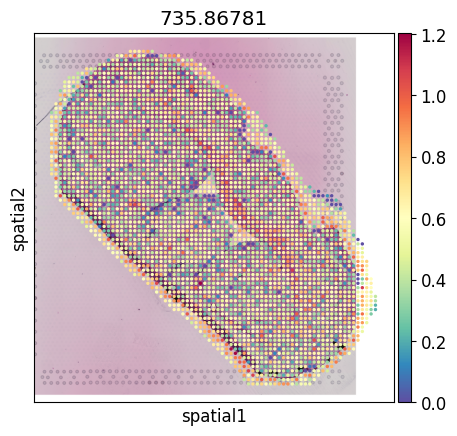

In [64]:
sc.pl.spatial(ms_adata, 
              img_key="hires", 
              color=['735.86781'], 
              cmap='Spectral_r', 
              ncols=3,
              img=None, 
              size=0.05,
              spot_size=None,
              bw=False, 
              alpha_img=1)#color是一个感兴趣的基因的list

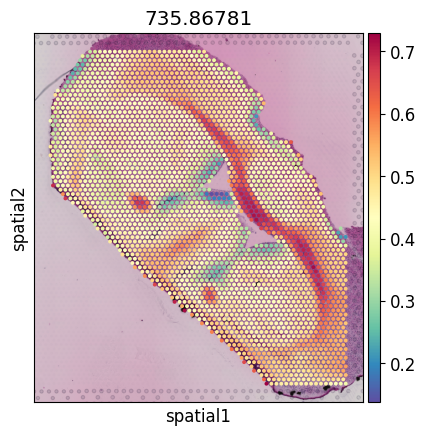

In [63]:
sc.pl.spatial(adata_SMLED, 
              img_key="hires", 
              color=['735.86781'], 
              cmap='Spectral_r', 
              ncols=3,
              img=None, 
              size=0.05,
              spot_size=None,
              bw=False, 
              alpha_img=1)#color是一个感兴趣的基因的list

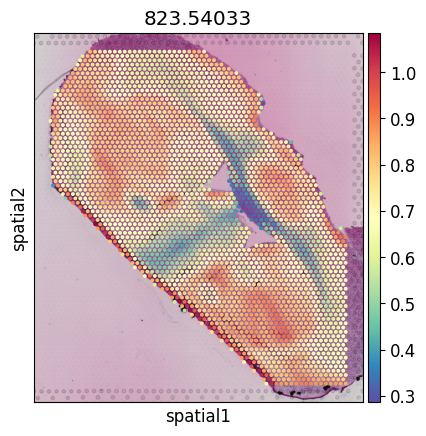

In [65]:
sc.pl.spatial(adata_SMLED, 
              img_key="hires", 
              color=['823.54033'], 
              cmap='Spectral_r', 
              ncols=3,
              img=None, 
              size=0.05,
              spot_size=None,
              bw=False, 
              alpha_img=1)#color是一个感兴趣的基因的list

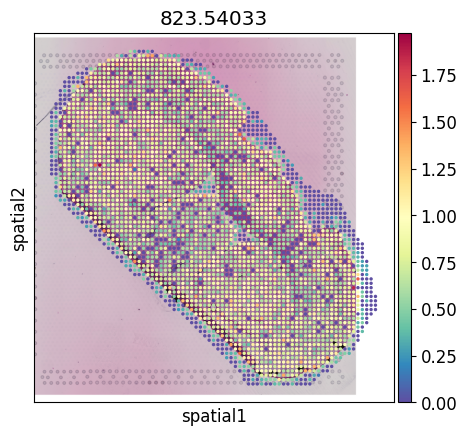

In [61]:
sc.pl.spatial(ms_adata, 
              img_key="hires", 
              color=['823.54033'], 
              cmap='Spectral_r', 
              ncols=3,
              img=None, 
              size=0.05,
              spot_size=None,
              bw=False, 
              alpha_img=1)#color是一个感兴趣的基因的list

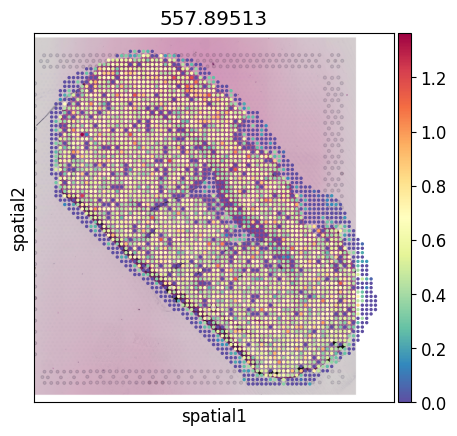

In [59]:
sc.pl.spatial(ms_adata, 
              img_key="hires", 
              color=['557.89513'], 
              cmap='Spectral_r', 
              ncols=3,
              img=None, 
              size=0.05,
              spot_size=None,
              bw=False, 
              alpha_img=1)#color是一个感兴趣的基因的list

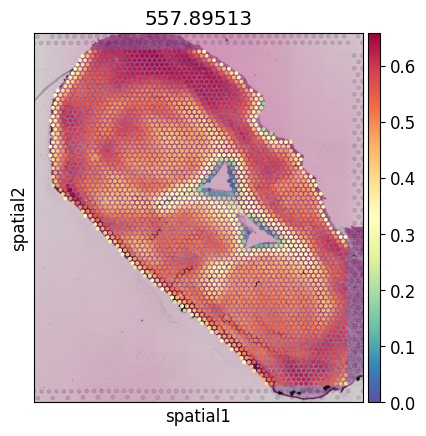

In [60]:
sc.pl.spatial(adata_SMLED, 
              img_key="hires", 
              color=['557.89513'], 
              cmap='Spectral_r', 
              ncols=3,
              img=None, 
              size=0.05,
              spot_size=None,
              bw=False, 
              alpha_img=1)#color是一个感兴趣的基因的list

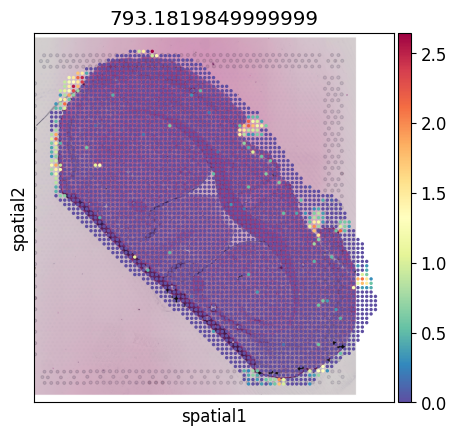

In [78]:
sc.pl.spatial(ms_adata, 
              img_key="hires", 
              color=['793.1819849999999'], 
              cmap='Spectral_r', 
              ncols=3,
              img=None, 
              size=0.05,
              spot_size=None,
              bw=False, 
              alpha_img=1)#color是一个感兴趣的基因的list

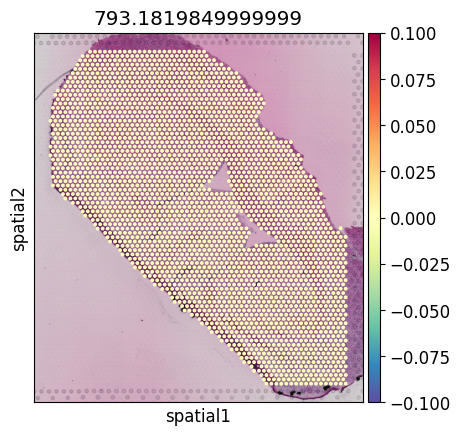

In [79]:
sc.pl.spatial(adata_SMLED, 
              img_key="hires", 
              color=['793.1819849999999'], 
              cmap='Spectral_r', 
              ncols=3,
              img=None, 
              size=0.05,
              spot_size=None,
              bw=False, 
              alpha_img=1)#color是一个感兴趣的基因的list

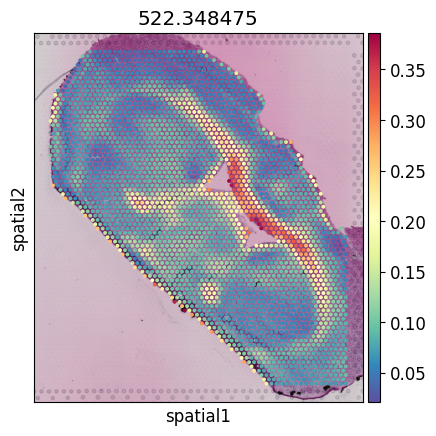

In [64]:
sc.pl.spatial(adata_SMLED, 
              img_key="hires", 
              color=['522.348475'], 
              cmap='Spectral_r', 
              ncols=3,
              img=None, 
              size=0.05,
              spot_size=None,
              bw=False, 
              alpha_img=1)#color是一个感兴趣的基因的list

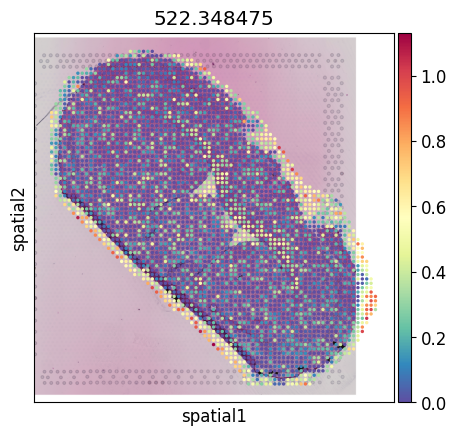

In [65]:
sc.pl.spatial(ms_adata, 
              img_key="hires", 
              color=['522.348475'], 
              cmap='Spectral_r', 
              ncols=3,
              img=None, 
              size=0.05,
              spot_size=None,
              bw=False, 
              alpha_img=1)#color是一个感兴趣的基因的list

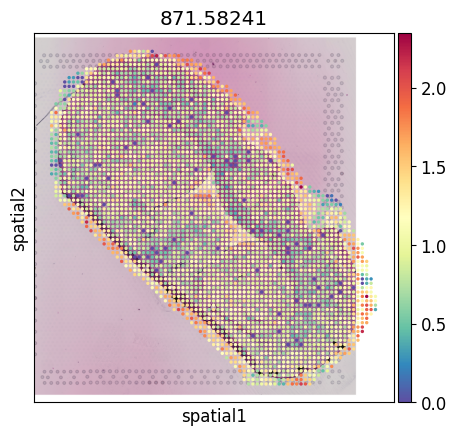

In [66]:
sc.pl.spatial(ms_adata, 
              img_key="hires", 
              color=['871.58241'], 
              cmap='Spectral_r', 
              ncols=3,
              img=None, 
              size=0.05,
              spot_size=None,
              bw=False, 
              alpha_img=1)#color是一个感兴趣的基因的list

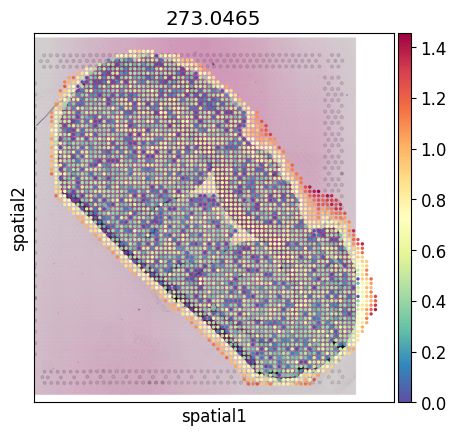

In [67]:
sc.pl.spatial(ms_adata, 
              img_key="hires", 
              color=['273.0465'], 
              cmap='Spectral_r', 
              ncols=3,
              img=None, 
              size=0.05,
              spot_size=None,
              bw=False, 
              alpha_img=1)#color是一个感兴趣的基因的list

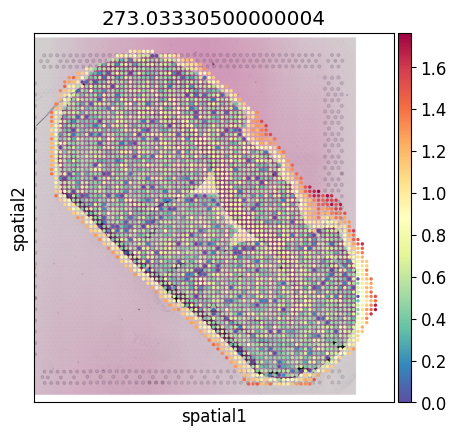

In [68]:
sc.pl.spatial(ms_adata, 
              img_key="hires", 
              color=['273.03330500000004'], 
              cmap='Spectral_r', 
              ncols=3,
              img=None, 
              size=0.05,
              spot_size=None,
              bw=False, 
              alpha_img=1)#color是一个感兴趣的基因的list

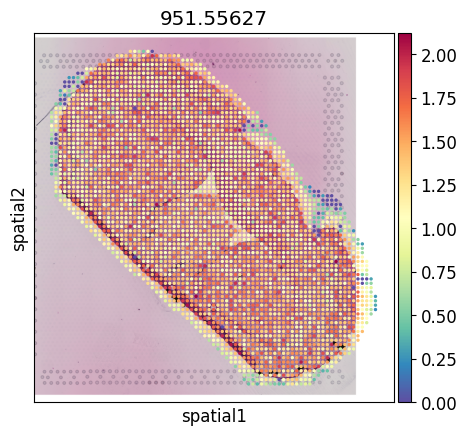

In [69]:
sc.pl.spatial(ms_adata, 
              img_key="hires", 
              color=['951.55627'], 
              cmap='Spectral_r', 
              ncols=3,
              img=None, 
              size=0.05,
              spot_size=None,
              bw=False, 
              alpha_img=1)#color是一个感兴趣的基因的list

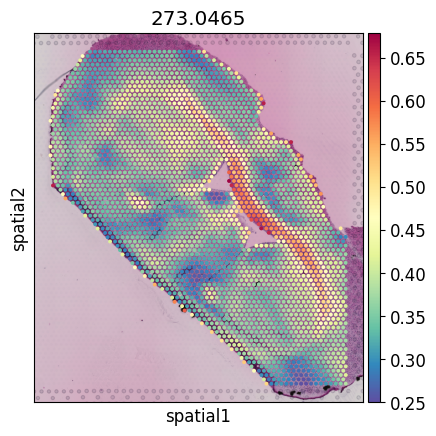

In [70]:
sc.pl.spatial(adata_SMLED, 
              img_key="hires", 
              color=['273.0465'], 
              cmap='Spectral_r', 
              ncols=3,
              img=None, 
              size=0.05,
              spot_size=None,
              bw=False, 
              alpha_img=1)#color是一个感兴趣的基因的list

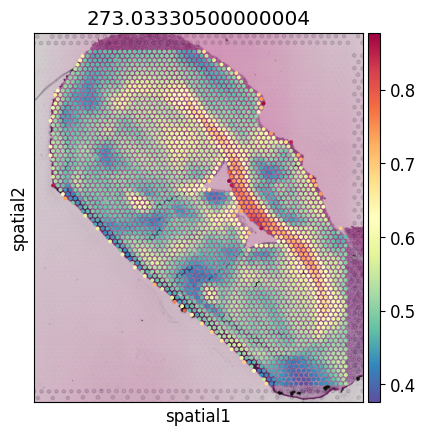

In [71]:
sc.pl.spatial(adata_SMLED, 
              img_key="hires", 
              color=['273.03330500000004'], 
              cmap='Spectral_r', 
              ncols=3,
              img=None, 
              size=0.05,
              spot_size=None,
              bw=False, 
              alpha_img=1)#color是一个感兴趣的基因的list

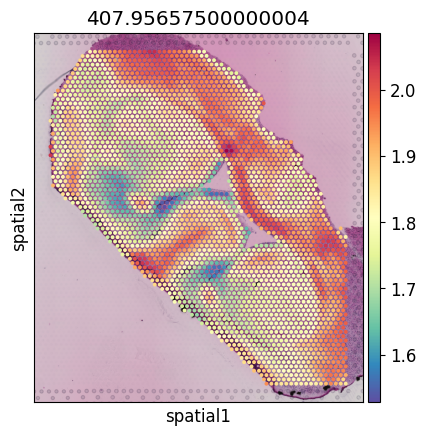

In [72]:
sc.pl.spatial(adata_SMLED, 
              img_key="hires", 
              color=['407.95657500000004'], 
              cmap='Spectral_r', 
              ncols=3,
              img=None, 
              size=0.05,
              spot_size=None,
              bw=False, 
              alpha_img=1)#color是一个感兴趣的基因的list

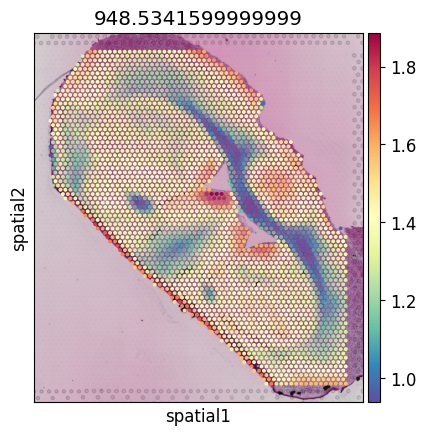

In [73]:
sc.pl.spatial(adata_SMLED, 
              img_key="hires", 
              color=['948.5341599999999'], 
              cmap='Spectral_r', 
              ncols=3,
              img=None, 
              size=0.05,
              spot_size=None,
              bw=False, 
              alpha_img=1)#color是一个感兴趣的基因的list

In [74]:
sc.pp.highly_variable_genes(ms_adata, flavor="seurat_v3", n_top_genes=500)
ms_adata[:, ms_adata.var['highly_variable']].var_names

/home/llx/software/miniconda3/envs/pyg_ms/lib/python3.9/site-packages/scanpy/preprocessing/_highly_variable_genes.py:64: UserWarning: `flavor='seurat_v3'` expects raw count data, but non-integers were found.
  warnings.warn(


Index(['136.06234', '146.16571', '152.02235000000002', '154.026815',
       '162.11258500000002', '162.11293999999998', '162.956185', '165.066415',
       '174.89605', '174.896565',
       ...
       '956.527845', '959.5795350000001', '961.511245', '961.54439',
       '964.48023', '965.51191', '966.549985', '967.552545', '992.560465',
       '992.614545'],
      dtype='object', length=500)

In [75]:
# ms_adata挑选这些基因set1 & set2
ms_adata_va = ms_adata[:,list(ms_adata_v)]
adata_SMLED_va = adata_SMLED[:,list(ms_adata_v)]

In [76]:
ms_column_sums = np.sum(ms_adata_va.X.A, axis=0)
# 除以行总数（m）
ms_m = ms_adata.X.A.shape[0]
ms_column_means = ms_column_sums / ms_m
SMLED_column_sums = np.sum(adata_SMLED_va.X.A, axis=0)
# 除以行总数（m）
SMLED_m = ms_adata.X.A.shape[0]
SMLED_column_means = SMLED_column_sums / SMLED_m

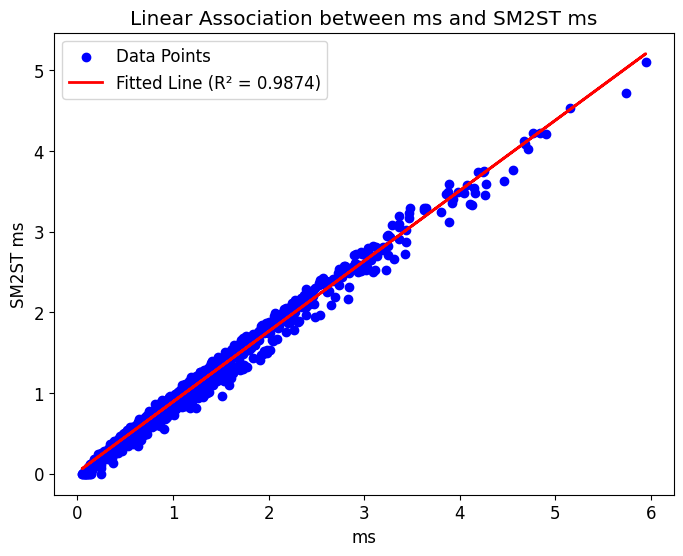

In [77]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score

# 假设 ms_column_means 和 SMLED_column_means 是两个 NumPy 数组
# 如果不是 NumPy 数组，可以使用 np.array() 进行转换

# 计算线性回归
X = ms_column_means.reshape(-1, 1)  # 将 ms_column_means 转换为列向量
y = SMLED_column_means

# 创建线性回归模型
model = LinearRegression()
model.fit(X, y)

# 预测值
y_pred = model.predict(X)

# 计算 R² 值
r2 = r2_score(y, y_pred)

# 绘制散点图和拟合曲线
plt.figure(figsize=(8, 6))
plt.scatter(X, y, color='blue', label='Data Points')  # 原始数据点
plt.plot(X, y_pred, color='red', linewidth=2, label=f'Fitted Line (R² = {r2:.4f})')  # 拟合曲线
plt.xlabel('ms')
plt.ylabel('SM2ST ms')
plt.title('Linear Association between ms and SM2ST ms')
plt.legend()
# plt.grid(True)
plt.show()